# Import Useful Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
%matplotlib inline

In [ ]:
import tensorflow
print (tensorflow.__version__)

2.13.0


# Download and Unzip Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import glob

# Define the path to the directory containing the folders
data_dir = '/content/drive/MyDrive/archive (10)'

# Define the paths to the four folders
trainA_dir = os.path.join(data_dir, 'trainA')
trainB_dir = os.path.join(data_dir, 'trainB')
testA_dir = os.path.join(data_dir, 'testA')
testB_dir = os.path.join(data_dir, 'testB')

# Use glob to get file paths for each category
apples_train = glob.glob(os.path.join(trainA_dir, '*.jpg'))
oranges_train = glob.glob(os.path.join(trainB_dir, '*.jpg'))
apples_test = glob.glob(os.path.join(testA_dir, '*.jpg'))
oranges_test = glob.glob(os.path.join(testB_dir, '*.jpg'))

In [ ]:
len(apples_train), len(oranges_train), len(apples_test), len(oranges_test)

(995, 1019, 266, 248)

In [ ]:
import cv2
for file in apples_train[:10]:
    img = cv2.imread(file)
    print (img.shape)

(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


# Display few Samples

Apples


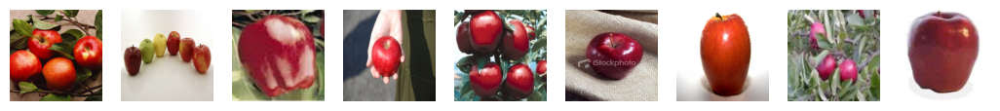

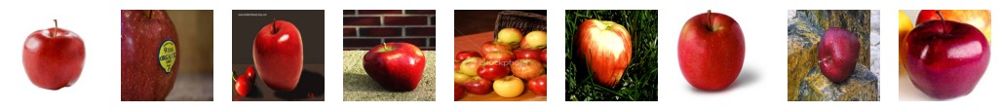

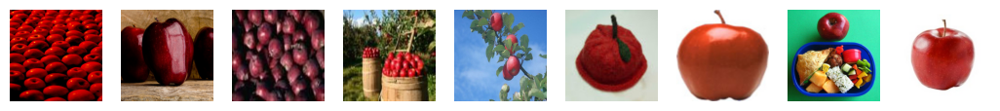

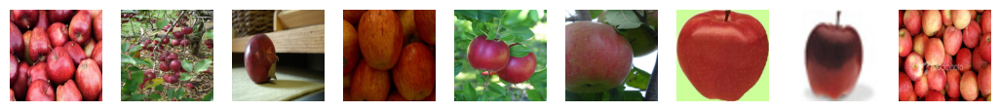

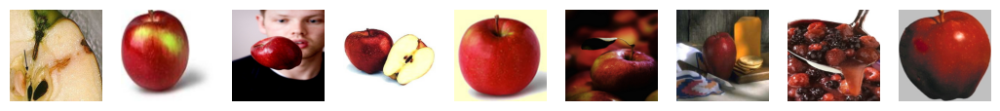

--------------------------------------------------------------------------------
Oranges


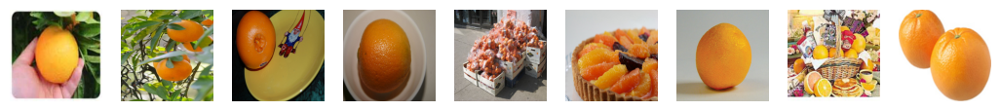

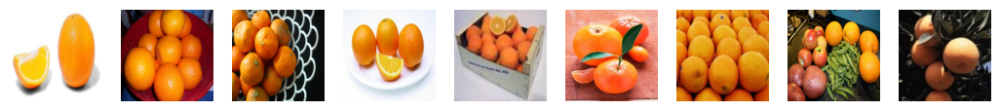

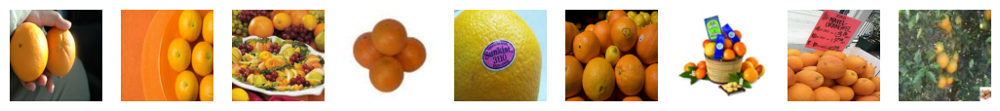

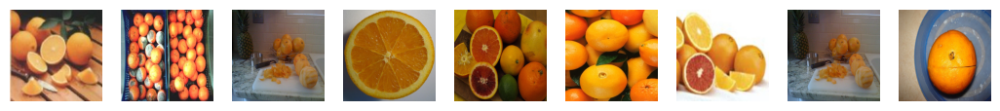

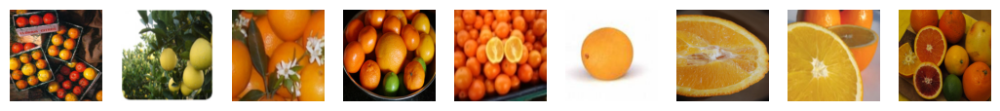

In [ ]:
print ("Apples")
for k in range(5):
    plt.figure(figsize=(13, 13))
    for j in range(9):
        file = np.random.choice(apples_train)
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(990 + 1 + j)
        plt.imshow(img)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

print ("-"*80)
print ("Oranges")
for k in range(5):
    plt.figure(figsize=(13, 13))
    for j in range(9):
        file = np.random.choice(oranges_train)
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(990 + 1 + j)
        plt.imshow(img)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

Apples


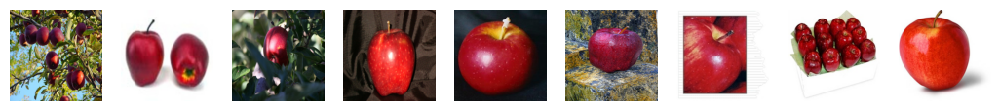

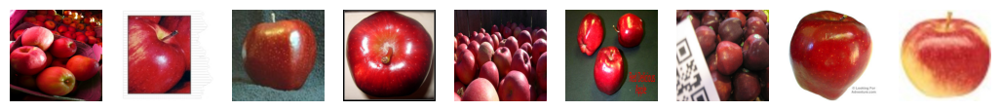

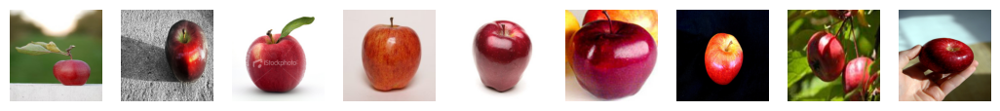

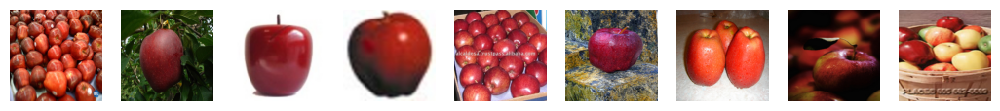

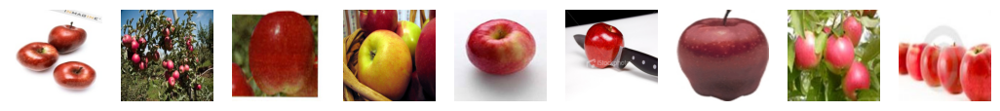

--------------------------------------------------------------------------------
Oranges


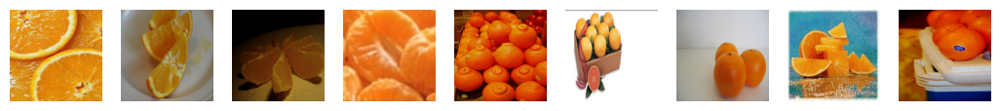

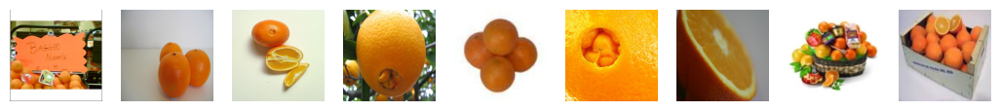

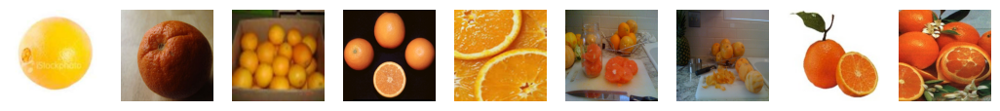

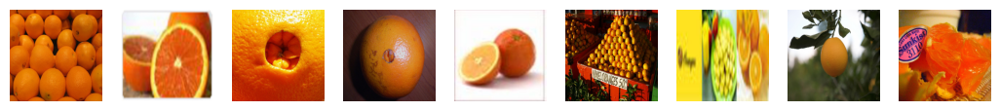

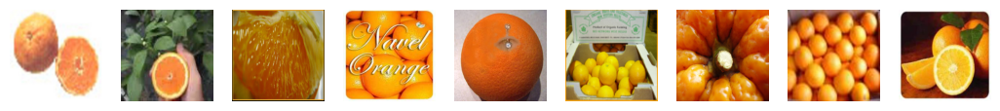

In [ ]:
print ("Apples")
for k in range(5):
    plt.figure(figsize=(13, 13))
    for j in range(9):
        file = np.random.choice(apples_train)
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(990 + 1 + j)
        plt.imshow(img)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

print ("-"*80)
print ("Oranges")
for k in range(5):
    plt.figure(figsize=(13, 13))
    for j in range(9):
        file = np.random.choice(oranges_train)
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(990 + 1 + j)
        plt.imshow(img)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

# Define Generator Model (U-Net Like)

In [ ]:
pip install tensorflow_addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 612.1/612.1 kB 5.8 MB/s eta 0:00:00


In [ ]:
import tensorflow_addons as tfa

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [ ]:
def encoder_layer(input_layer, filters, bn=True):
    x = tensorflow.keras.layers.Conv2D(filters, kernel_size=(4,4), strides=(2,2), padding='same')(input_layer)
    x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
    if bn:
        x = tfa.layers.InstanceNormalization()(x)
    return x

def decoder_layer(input_layer, skip_input, filters):
    x = tensorflow.keras.layers.Conv2DTranspose(filters, kernel_size=(4,4), strides=(2,2), padding='same')(input_layer)
    x = tensorflow.keras.layers.Activation('relu')(x)
    x = tfa.layers.InstanceNormalization()(x)
    x = tensorflow.keras.layers.Concatenate()([x, skip_input])
    return x

In [ ]:
source_image_A = tensorflow.keras.layers.Input(shape=(256, 256, 3))
source_image_B = tensorflow.keras.layers.Input(shape=(256, 256, 3))

def make_generator():
    source_image = tensorflow.keras.layers.Input(shape=(256, 256, 3))

    e1 = encoder_layer(source_image, 32, bn=False)
    e2 = encoder_layer(e1, 64)
    e3 = encoder_layer(e2, 128)
    e4 = encoder_layer(e3, 256)
    e5 = encoder_layer(e4, 256)
    e6 = encoder_layer(e5, 256)
    e7 = encoder_layer(e6, 256)

    bottle_neck = tensorflow.keras.layers.Conv2D(512, (4,4), strides=(2,2), padding='same')(e7)
    b = tensorflow.keras.layers.Activation('relu')(bottle_neck)

    d1 = decoder_layer(b, e7, 256)
    d2 = decoder_layer(d1, e6, 256)
    d3 = decoder_layer(d2, e5, 256)
    d4 = decoder_layer(d3, e4, 256)
    d5 = decoder_layer(d4, e3, 256)
    d6 = decoder_layer(d5, e2, 64)
    d7 = decoder_layer(d6, e1, 32)

    decoded = tensorflow.keras.layers.Conv2DTranspose(3, kernel_size=(4,4), strides=(2,2), padding='same')(d7)
    translated_image = tensorflow.keras.layers.Activation('tanh')(decoded)
    return source_image, translated_image

source_image, translated_image = make_generator()
generator_network_AB = tensorflow.keras.models.Model(inputs=source_image, outputs=translated_image)

source_image, translated_image = make_generator()
generator_network_BA = tensorflow.keras.models.Model(inputs=source_image, outputs=translated_image)

print (generator_network_AB.summary())

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_9 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d_28 (Conv2D)          (None, 128, 128, 32)         1568      ['input_9[0][0]']             
                                                                                                  
 leaky_re_lu_24 (LeakyReLU)  (None, 128, 128, 32)         0         ['conv2d_28[0][0]']           
                                                                                                  
 conv2d_29 (Conv2D)          (None, 64, 64, 64)           32832     ['leaky_re_lu_24[0][0]']      
                                                                                            

# Define Discriminator Network

In [ ]:
def my_conv_layer(input_layer, filters, bn=True):
    x = tensorflow.keras.layers.Conv2D(filters, kernel_size=(4,4), strides=(2,2), padding='same')(input_layer)
    x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
    if bn:
        #x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)
        x = tfa.layers.InstanceNormalization()(x)
    return x

In [ ]:
 def make_discriminator():
    target_image_input = tensorflow.keras.layers.Input(shape=(256, 256, 3))

    x = my_conv_layer(target_image_input, 64, bn=False)
    x = my_conv_layer(x, 128)
    x = my_conv_layer(x, 256)
    x = my_conv_layer(x, 512)
    x = my_conv_layer(x, 512)

    patch_features = tensorflow.keras.layers.Conv2D(1, kernel_size=(4,4), strides=(1,1), padding='same')(x)
    return target_image_input, patch_features


target_image_input, patch_features = make_discriminator()
discriminator_network_A = tensorflow.keras.models.Model(inputs=target_image_input, outputs=patch_features)

target_image_input, patch_features = make_discriminator()
discriminator_network_B = tensorflow.keras.models.Model(inputs=target_image_input, outputs=patch_features)

print (discriminator_network_A.summary())

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 64)      3136      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 128, 128, 64)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 128)       131200    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 64, 64, 128)       0         
                                                                 
 instance_normalization (In  (None, 64, 64, 128)       256       
 stanceNormalization)                                            
                                                             

In [ ]:
adam_optimizer = tensorflow.keras.optimizers.legacy.Adam(learning_rate=0.0002, beta_1=0.5)
discriminator_network_A.compile(loss='mse', optimizer=adam_optimizer, metrics=['accuracy'])
discriminator_network_B.compile(loss='mse', optimizer=adam_optimizer, metrics=['accuracy'])

# Define Cycle-GAN

In [ ]:
# Domain Transfer
fake_B = generator_network_AB(source_image_A)
fake_A = generator_network_BA(source_image_B)

# Restoring original Domain
get_back_A = generator_network_BA(fake_B)
get_back_B = generator_network_AB(fake_A)

# Get back Identical/Same Image
get_same_A = generator_network_BA(source_image_A)
get_same_B = generator_network_AB(source_image_B)

discriminator_network_A.trainable=False
discriminator_network_B.trainable=False

# Tell Real vs Fake, for a given domain
verify_A = discriminator_network_A(fake_A)
verify_B = discriminator_network_B(fake_B)

cycle_gan = tensorflow.keras.models.Model(inputs = [source_image_A, source_image_B], \
                              outputs = [verify_A, verify_B, get_back_A, get_back_B, get_same_A, get_same_B])
cycle_gan.summary()

NameError: ignored

# Compiling Model

In [ ]:
cycle_gan.compile(loss=['mse', 'mse', 'mae', 'mae', 'mae', 'mae'], loss_weights=[1, 1, 10, 10, 3, 3],\
                                          optimizer=adam_optimizer)

NameError: ignored

# Define Data Generators

In [ ]:
def apples_to_oranges(apples, generator_network):
    generated_samples = generator_network.predict_on_batch(apples)
    return generated_samples

def oranges_to_apples(oranges, generator_network):
    generated_samples = generator_network.predict_on_batch(oranges)
    return generated_samples

def get_apple_samples(batch_size):
    random_files = np.random.choice(apples_train, size=batch_size)
    images = []
    for file in random_files:
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append((img-127.5)/127.5)
    apple_images = np.array(images)
    return apple_images

def get_orange_samples(batch_size):
    random_files = np.random.choice(oranges_train, size=batch_size)
    images = []
    for file in random_files:
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append((img-127.5)/127.5)
    orange_images = np.array(images)
    return orange_images

def show_generator_results_apples_to_oranges(generator_network_AB, generator_network_BA):
    images = []
    for j in range(7):
        file = np.random.choice(apples_test)
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append(img)

    print ('Input Apple Images')
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(images):
        plt.subplot(770 + 1 + j)
        plt.imshow(img)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

    print ('Translated (Apple -> Orange) Images')
    translated = []
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(images):
        img = (img-127.5)/127.5
        output = apples_to_oranges(np.array([img]), generator_network_AB)[0]
        translated.append(output)
        output = (output+1.0)/2.0
        plt.subplot(770 + 1 + j)
        plt.imshow(output)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

    print ('Translated reverse ( Fake Oranges -> Fake Apples)')
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(translated):
        output = oranges_to_apples(np.array([img]), generator_network_BA)[0]
        output = (output+1.0)/2.0
        plt.subplot(770 + 1 + j)
        plt.imshow(output)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

def show_generator_results_oranges_to_apples(generator_network_AB, generator_network_BA):
    images = []
    for j in range(7):
        file = np.random.choice(oranges_test)
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append(img)

    print ('Input Orange Images')
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(images):
        plt.subplot(770 + 1 + j)
        plt.imshow(img)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

    print ('Translated (Orange -> Apple) Images')
    translated = []
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(images):
        img = (img-127.5)/127.5
        output = oranges_to_apples(np.array([img]), generator_network_BA)[0]
        translated.append(output)
        output = (output+1.0)/2.0
        plt.subplot(770 + 1 + j)
        plt.imshow(output)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

    print ('Translated reverse (Fake Apples -> Fake Oranges)')
    plt.figure(figsize=(13, 13))
    for j, img in enumerate(translated):
        output = apples_to_oranges(np.array([img]), generator_network_AB)[0]
        output = (output+1.0)/2.0
        plt.subplot(770 + 1 + j)
        plt.imshow(output)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

#8-bit quantization and inferencing

In [ ]:
from tensorflow.keras.models import load_model
import tensorflow as tf
import tensorflow_addons as tfa

custom_objects = {'InstanceNormalization': tfa.layers.InstanceNormalization}

save_path = "/content/drive/MyDrive/archive (10)/generator_network_AB.h5"
generator_network_AB = load_model(save_path, custom_objects=custom_objects)


save_path = "/content/drive/MyDrive/archive (10)/generator_network_BA.h5"
generator_network_BA = load_model(save_path, custom_objects=custom_objects)


Input Orange Images


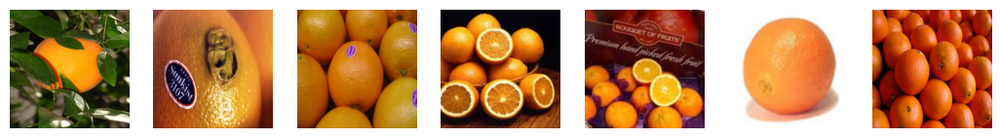

Translated (Orange -> Apple) Images


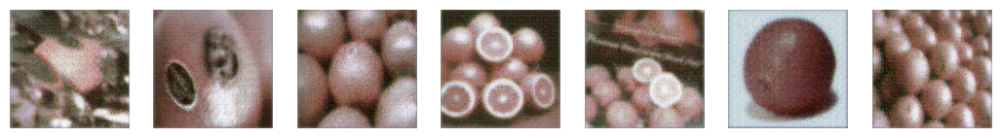

Translated reverse (Fake Apples -> Fake Oranges)
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


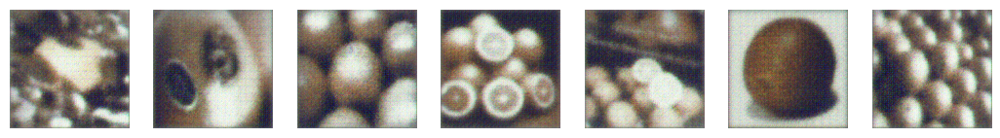

In [ ]:
show_generator_results_oranges_to_apples(generator_network_AB,generator_network_BA)

In [ ]:
pip install tensorflow==2.7.0


ERROR: Could not find a version that satisfies the requirement tensorflow==2.7.0 (from versions: 2.8.0rc0, 2.8.0rc1, 2.8.0, 2.8.1, 2.8.2, 2.8.3, 2.8.4, 2.9.0rc0, 2.9.0rc1, 2.9.0rc2, 2.9.0, 2.9.1, 2.9.2, 2.9.3, 2.10.0rc0, 2.10.0rc1, 2.10.0rc2, 2.10.0rc3, 2.10.0, 2.10.1, 2.11.0rc0, 2.11.0rc1, 2.11.0rc2, 2.11.0, 2.11.1, 2.12.0rc0, 2.12.0rc1, 2.12.0, 2.12.1, 2.13.0rc0, 2.13.0rc1, 2.13.0rc2, 2.13.0, 2.13.1, 2.14.0rc0, 2.14.0rc1, 2.14.0)
ERROR: No matching distribution found for tensorflow==2.7.0


In [ ]:
pip install tf-nightly

In [ ]:
import tensorflow as tf
import tensorflow_addons as tfa

# ... (your model definition code) ...

# Load your pre-trained weights into the models
# generator_network_AB.load_weights('generator_AB_weights.h5')
# generator_network_BA.load_weights('generator_BA_weights.h5')

# Convert the models to TensorFlow Lite format
converter_AB = tf.lite.TFLiteConverter.from_keras_model(generator_network_AB)
converter_BA = tf.lite.TFLiteConverter.from_keras_model(generator_network_BA)

# Perform post-training quantization
converter_AB.optimizations = [tf.lite.Optimize.DEFAULT]
converter_BA.optimizations = [tf.lite.Optimize.DEFAULT]

tflite_quantized_AB = converter_AB.convert()
tflite_quantized_BA = converter_BA.convert()

# Save the quantized models to files
with open('quantized_generator_AB.tflite', 'wb') as f:
    f.write(tflite_quantized_AB)

with open('quantized_generator_BA.tflite', 'wb') as f:
    f.write(tflite_quantized_BA)


In [ ]:
def apples_to_oranges(apples, interpreter):
    # Prepare input data
    input_details = interpreter.get_input_details()
    input_shape = input_details[0]['shape']

    # Resize 'apples' to match the input shape of the TFLite model
    apples_resized = np.resize(apples, input_shape).astype(np.float32)

    # Set the input tensor with the resized 'apples' data
    interpreter.set_tensor(input_details[0]['index'], apples_resized)

    # Perform inference
    interpreter.invoke()

    # Get the output tensor(s)
    output_details = interpreter.get_output_details()
    generated_samples = interpreter.get_tensor(output_details[0]['index'])

    return generated_samples

def oranges_to_apples(oranges, interpreter):
    # Prepare input data
    input_details = interpreter.get_input_details()
    input_shape = input_details[0]['shape']

    # Resize 'oranges' to match the input shape of the TFLite model
    oranges_resized = np.resize(oranges, input_shape).astype(np.float32)

    # Set the input tensor with the resized 'oranges' data
    interpreter.set_tensor(input_details[0]['index'], oranges_resized)

    # Perform inference
    interpreter.invoke()

    # Get the output tensor(s)
    output_details = interpreter.get_output_details()
    generated_samples = interpreter.get_tensor(output_details[0]['index'])

    return generated_samples

# Replace these paths with your actual data paths
# apples_train = ['path_to_apple_image1.jpg', 'path_to_apple_image2.jpg', ...]
# oranges_train = ['path_to_orange_image1.jpg', 'path_to_orange_image2.jpg', ...]
# apples_test = ['path_to_apple_image1.jpg', 'path_to_apple_image2.jpg', ...]
# oranges_test = ['path_to_orange_image1.jpg', 'path_to_orange_image2.jpg', ...]

def get_apple_samples(batch_size):
    random_files = np.random.choice(apples_train, size=batch_size)
    images = []
    for file in random_files:
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append((img - 127.5) / 127.5)
    apple_images = np.array(images)
    return apple_images

def get_orange_samples(batch_size):
    random_files = np.random.choice(oranges_train, size=batch_size)
    images = []
    for file in random_files:
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append((img - 127.5) / 127.5)
    orange_images = np.array(images)
    return orange_images



In [ ]:
tflite_model_AB_path = '/content/quantized_generator_AB.tflite'
tflite_model_BA_path = '/content/quantized_generator_BA.tflite'

interpreter_AB = tf.lite.Interpreter(model_path=tflite_model_AB_path)
interpreter_AB.allocate_tensors()

interpreter_BA = tf.lite.Interpreter(model_path=tflite_model_BA_path)
interpreter_BA.allocate_tensors()


Input Orange Images


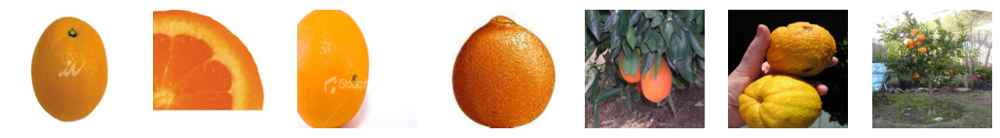

Translated (Orange -> Apple) Images


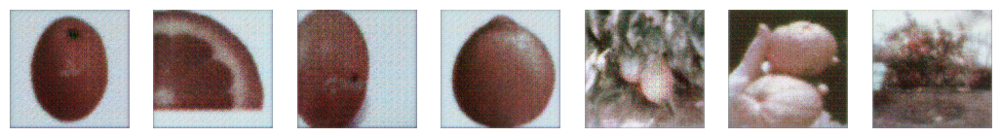

Translated reverse (Fake Apples -> Fake Oranges)


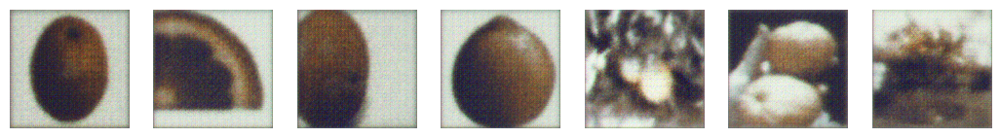

In [ ]:
show_generator_results_oranges_to_apples(interpreter_AB,interpreter_BA)

# Training Cycle-GAN Model

In [ ]:
len(apples_train), len(oranges_train)

(995, 1019)

Input Apple Images


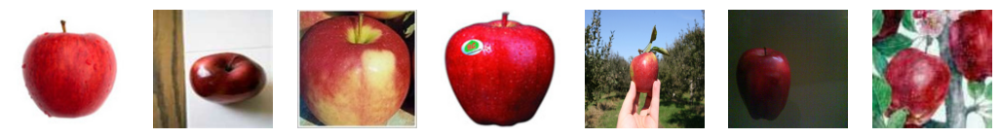

Translated (Apple -> Orange) Images


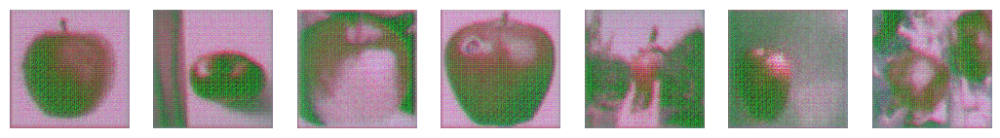

Translated reverse ( Fake Oranges -> Fake Apples)


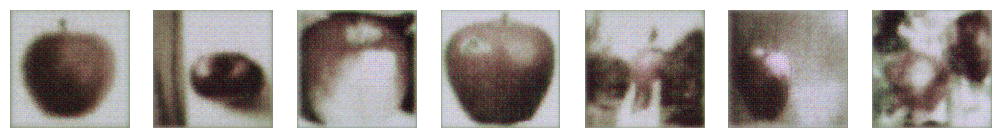

----------------------------------------------------------------------------------------------------
Input Orange Images


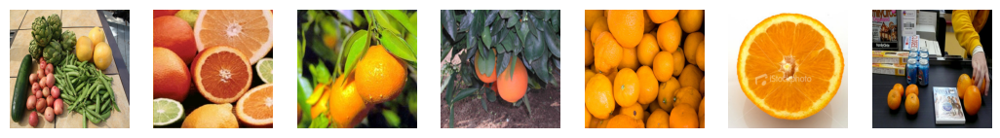

Translated (Orange -> Apple) Images


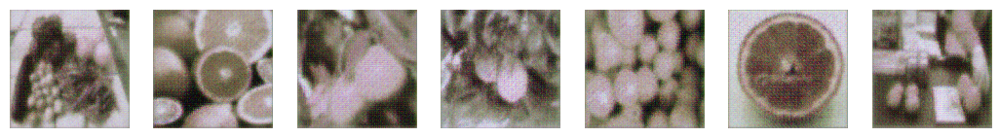

Translated reverse (Fake Apples -> Fake Oranges)


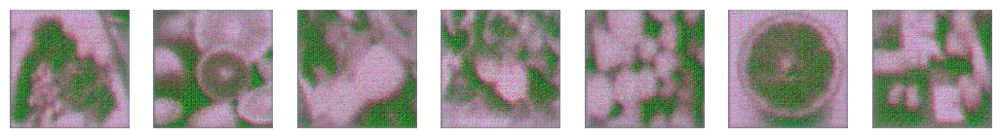

Epoch:0, Step:0, DA-Loss:0.365, DA-Acc:51.562, DB-Loss:0.202, DB-Acc:76.562, G-Loss:13.385
Epoch:0, Step:50, DA-Loss:0.393, DA-Acc:50.000, DB-Loss:0.286, DB-Acc:64.062, G-Loss:10.078
Input Apple Images


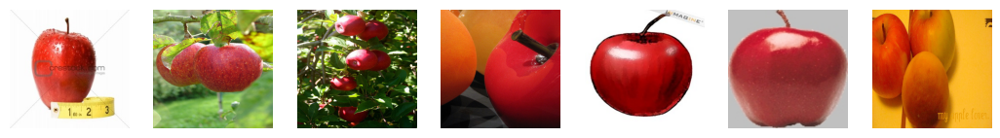

Translated (Apple -> Orange) Images


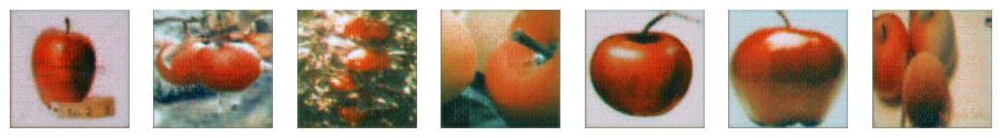

Translated reverse ( Fake Oranges -> Fake Apples)


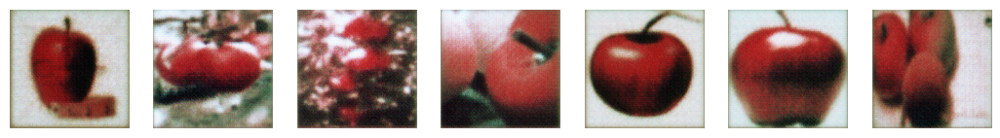

----------------------------------------------------------------------------------------------------
Input Orange Images


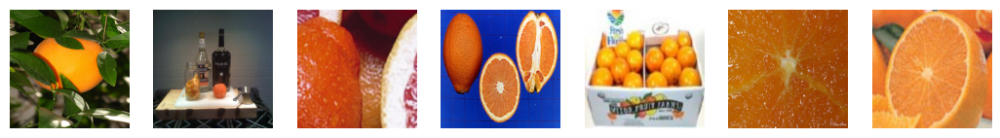

Translated (Orange -> Apple) Images


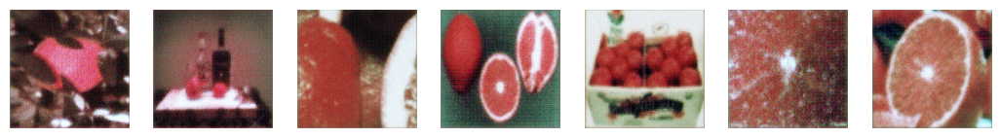

Translated reverse (Fake Apples -> Fake Oranges)


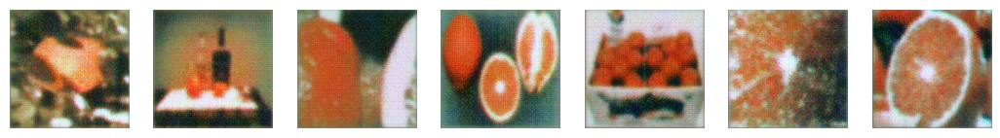

Epoch:1, Step:0, DA-Loss:0.300, DA-Acc:58.594, DB-Loss:0.310, DB-Acc:63.281, G-Loss:8.816
Epoch:1, Step:50, DA-Loss:0.242, DA-Acc:59.375, DB-Loss:0.230, DB-Acc:80.469, G-Loss:12.292
Input Apple Images


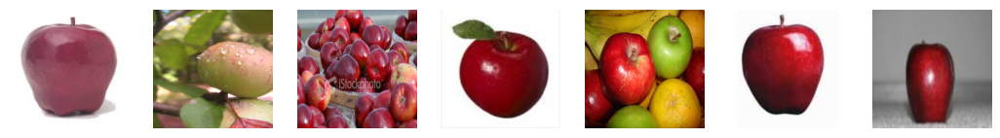

Translated (Apple -> Orange) Images


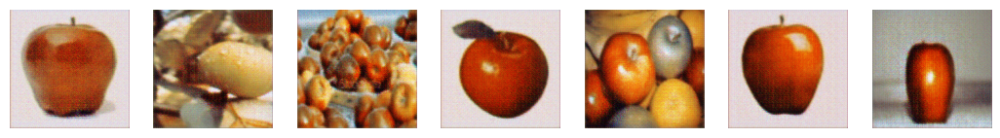

Translated reverse ( Fake Oranges -> Fake Apples)


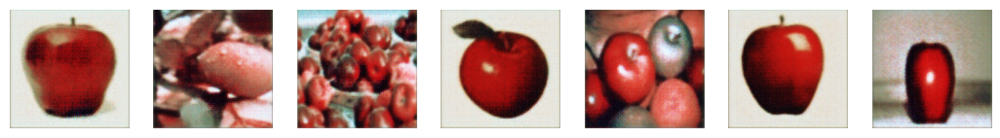

----------------------------------------------------------------------------------------------------
Input Orange Images


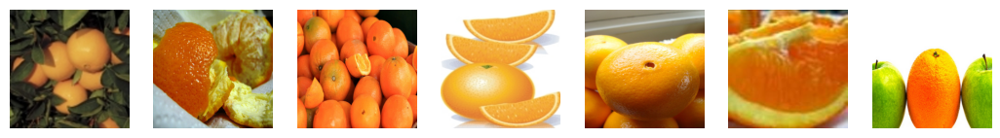

Translated (Orange -> Apple) Images


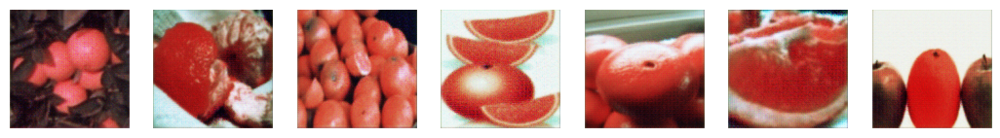

Translated reverse (Fake Apples -> Fake Oranges)


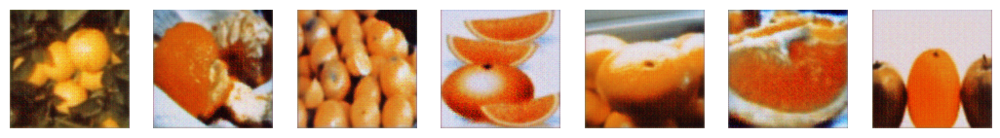

Epoch:2, Step:0, DA-Loss:0.337, DA-Acc:58.594, DB-Loss:0.334, DB-Acc:44.531, G-Loss:5.576
Epoch:2, Step:50, DA-Loss:0.486, DA-Acc:48.438, DB-Loss:0.199, DB-Acc:71.875, G-Loss:6.256
Epoch:2, Step:50, DA-Loss:0.486, DA-Acc:48.438, DB-Loss:0.199, DB-Acc:71.875, G-Loss:6.256
Input Apple Images
Input Apple Images


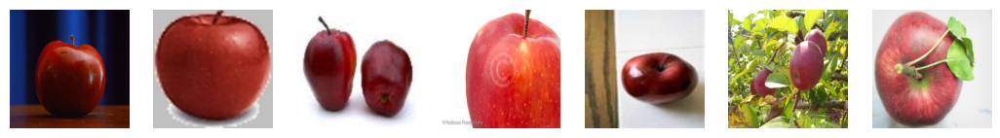

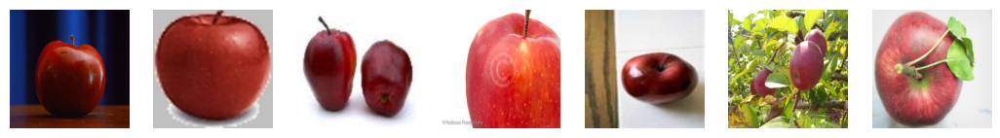

Translated (Apple -> Orange) Images
Translated (Apple -> Orange) Images


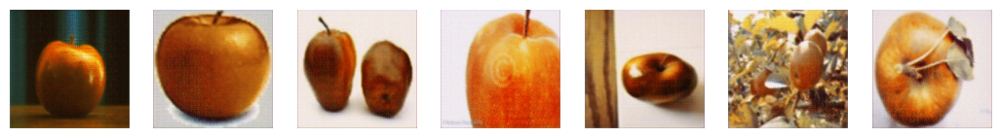

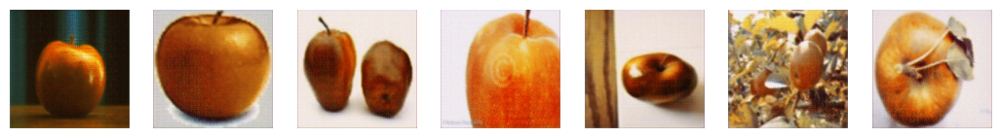

Translated reverse ( Fake Oranges -> Fake Apples)
Translated reverse ( Fake Oranges -> Fake Apples)


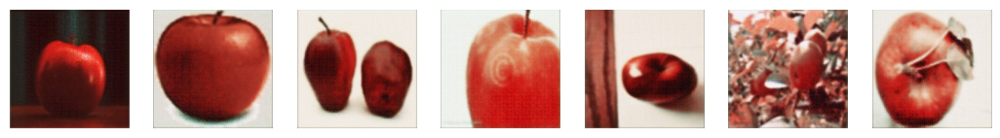

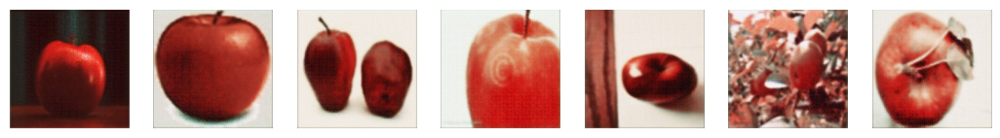

----------------------------------------------------------------------------------------------------
Input Orange Images
----------------------------------------------------------------------------------------------------
Input Orange Images


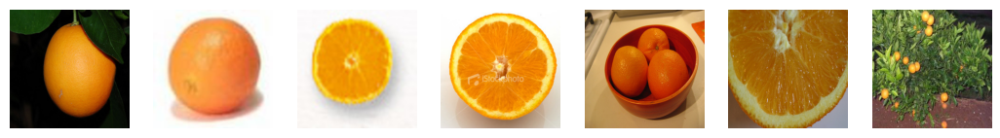

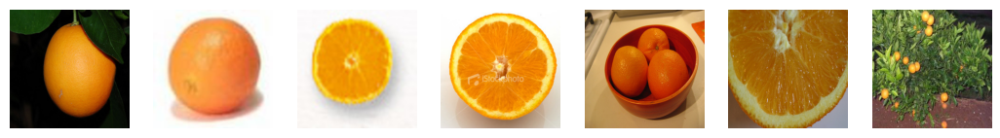

Translated (Orange -> Apple) Images
Translated (Orange -> Apple) Images


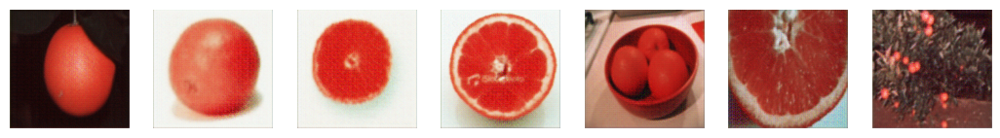

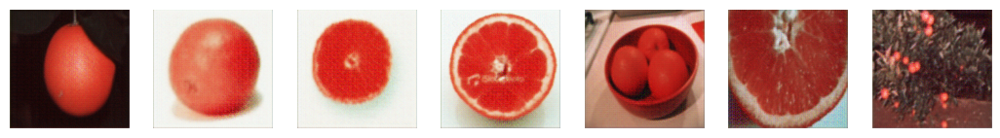

Translated reverse (Fake Apples -> Fake Oranges)
Translated reverse (Fake Apples -> Fake Oranges)


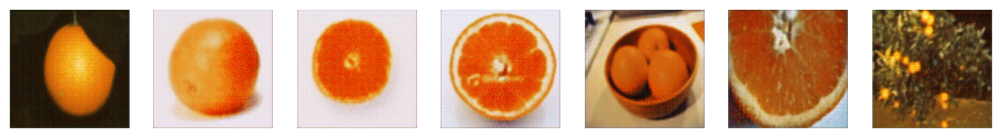

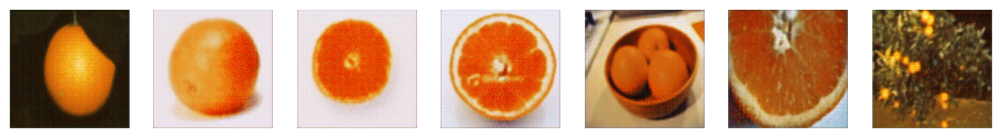

Epoch:3, Step:0, DA-Loss:0.563, DA-Acc:50.000, DB-Loss:0.487, DB-Acc:36.719, G-Loss:4.725
Epoch:3, Step:0, DA-Loss:0.563, DA-Acc:50.000, DB-Loss:0.487, DB-Acc:36.719, G-Loss:4.725
Epoch:3, Step:50, DA-Loss:0.391, DA-Acc:50.781, DB-Loss:0.186, DB-Acc:71.875, G-Loss:4.762
Epoch:3, Step:50, DA-Loss:0.391, DA-Acc:50.781, DB-Loss:0.186, DB-Acc:71.875, G-Loss:4.762
Input Apple Images
Input Apple Images


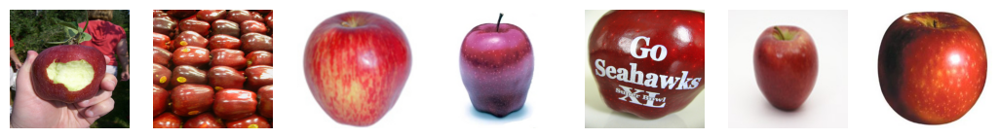

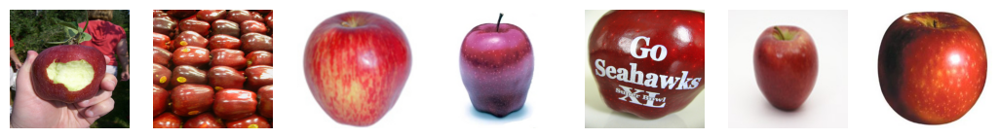

Translated (Apple -> Orange) Images
Translated (Apple -> Orange) Images


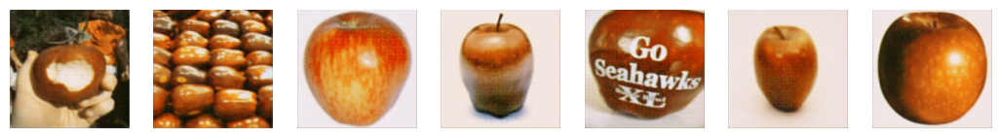

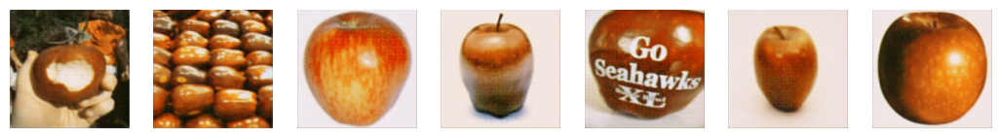

Translated reverse ( Fake Oranges -> Fake Apples)
Translated reverse ( Fake Oranges -> Fake Apples)


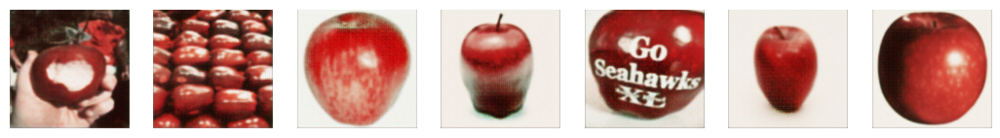

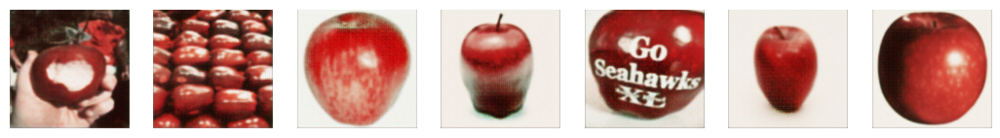

----------------------------------------------------------------------------------------------------
Input Orange Images
----------------------------------------------------------------------------------------------------
Input Orange Images


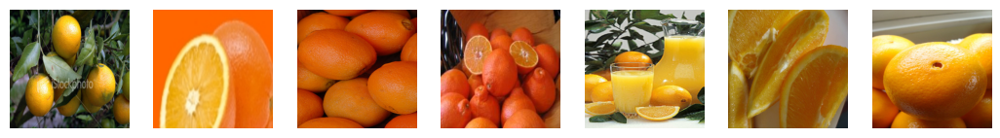

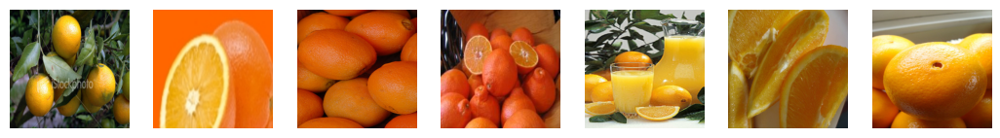

Translated (Orange -> Apple) Images
Translated (Orange -> Apple) Images


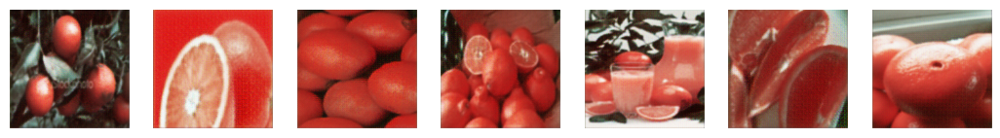

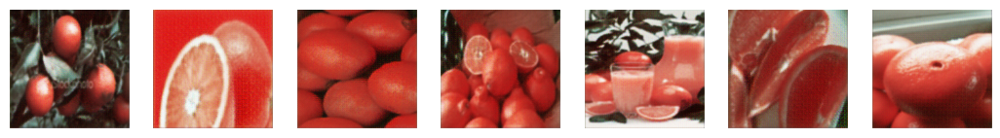

Translated reverse (Fake Apples -> Fake Oranges)
Translated reverse (Fake Apples -> Fake Oranges)


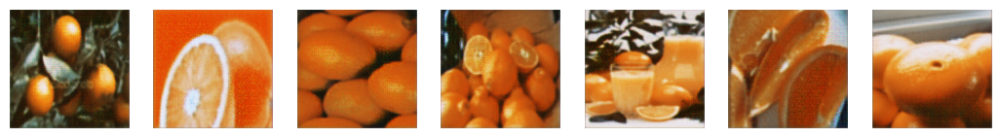

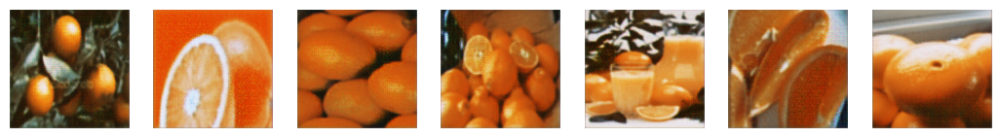

Epoch:4, Step:0, DA-Loss:0.210, DA-Acc:73.438, DB-Loss:0.531, DB-Acc:53.125, G-Loss:4.718
Epoch:4, Step:0, DA-Loss:0.210, DA-Acc:73.438, DB-Loss:0.531, DB-Acc:53.125, G-Loss:4.718
Epoch:4, Step:50, DA-Loss:0.330, DA-Acc:64.844, DB-Loss:0.193, DB-Acc:75.781, G-Loss:4.754
Epoch:4, Step:50, DA-Loss:0.330, DA-Acc:64.844, DB-Loss:0.193, DB-Acc:75.781, G-Loss:4.754


In [ ]:
epochs = 5
batch_size = 1
steps = 100

for i in range(0, epochs):
    for j in range(steps):
        if j%100 == 0:
            show_generator_results_apples_to_oranges(generator_network_AB, generator_network_BA)
            print ("-"*100)
            show_generator_results_oranges_to_apples(generator_network_AB, generator_network_BA)

        # A == Apples
        # B == Oranges
        domain_A_images = get_apple_samples(batch_size)
        domain_B_images = get_orange_samples(batch_size)

        fake_patch = np.zeros((batch_size, 8, 8, 1))
        real_patch = np.ones((batch_size, 8, 8, 1))

        fake_B_images = generator_network_AB(domain_A_images)
        fake_A_images = generator_network_BA(domain_B_images)

        # Updating Discriminator A weights
        discriminator_network_A.trainable=True
        discriminator_network_B.trainable=False
        loss_d_real_A = discriminator_network_A.train_on_batch(domain_A_images, real_patch)
        loss_d_fake_A = discriminator_network_A.train_on_batch(fake_A_images, fake_patch)

        loss_d_A = np.add(loss_d_real_A, loss_d_fake_A)/2.0

        # Updating Discriminator B weights
        discriminator_network_B.trainable=True
        discriminator_network_A.trainable=False
        loss_d_real_B = discriminator_network_B.train_on_batch(domain_B_images, real_patch)
        loss_d_fake_B = discriminator_network_B.train_on_batch(fake_B_images, fake_patch)

        loss_d_B = np.add(loss_d_real_B, loss_d_fake_B)/2.0

        # Make the Discriminator belive that these are real samples and calculate loss to train the generator

        discriminator_network_A.trainable=False
        discriminator_network_B.trainable=False

        # Updating Generator weights
        loss_g = cycle_gan.train_on_batch([domain_A_images, domain_B_images],\
                    [real_patch, real_patch, domain_A_images, domain_B_images, domain_A_images, domain_B_images])

        if j%50 == 0:
            print ("Epoch:%.0f, Step:%.0f, DA-Loss:%.3f, DA-Acc:%.3f, DB-Loss:%.3f, DB-Acc:%.3f, G-Loss:%.3f"\
                   %(i,j,loss_d_A[0],loss_d_A[1]*100,loss_d_B[0],loss_d_B[1]*100,loss_g[0]))
